# Nerve Segmentation — Experiment Comparison

Compares **6 experiments** (3 normalisations × 2 losses) by visualising
reconstructed full-image predictions side-by-side.

Normalization is applied to the **full slide image before tiling** (`retile_all.py --norm …`).
All nnUNet plans use `NoNormalization` so tiles are **never re-normalized per-patch**
during `nnUNetv2_preprocess` or training.

| Experiment | Loss | Norm (applied to full image before tiling) | nnUNet plan |
|---|---|---|---|
| `CE_Histo`  | DC + CE         | Histology — clip [1%, 99%], rescale → [0,1] | `nnUNetPlansHistoNorm` |
| `CE_Nyul`   | DC + CE         | Nyul landmark standardisation → [0,1]       | `nnUNetPlansNyulNorm`  |
| `CE_NoNorm` | DC + CE         | None (raw uint8)                             | `nnUNetPlansNoNorm`    |
| `TV_Histo`  | Tversky α=0.3 β=0.7 | Histology                               | `nnUNetPlansHistoNorm` |
| `TV_Nyul`   | Tversky         | Nyul                                         | `nnUNetPlansNyulNorm`  |
| `TV_NoNorm` | Tversky         | None                                         | `nnUNetPlansNoNorm`    |

**Class colour map**

| Class | Name | Colour |
|---|---|---|
| 0 | Background | Black |
| 1 | ConnectivePerineurium | Orange |
| 2 | Adipose | Cyan |
| 3 | NerveFascicle | Magenta |
| 4 | Blood_vessel | Red |

---

### How the pipeline works

```
retile_all.py --norm histology   →  imagesTr/ tiles are float32 [0,1]
nnUNetv2_preprocess  -plans_name nnUNetPlansHistoNorm   # NoNorm inside → no re-normalization
nnUNetv2_train  -p nnUNetPlansHistoNorm                 # reads already-normalized tiles
```

Each normalization group gets its own preprocessed-data folder in `nnUNet_preprocessed/`:
- `nnUNetPlansHistoNorm_2d/`  ← histology-normalized tiles
- `nnUNetPlansNyulNorm_2d/`   ← Nyul-normalized tiles
- `nnUNetPlans_2d/`           ← raw (no normalization) tiles

> Run `bash run_experiments.sh` to tile, preprocess, and train all experiments.


In [11]:
import os, glob, json, warnings
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from PIL import Image

# ── Config ────────────────────────────────────────────────────────────────
WORKSPACE    = '/home/moyasans/Documents/nnUNet'
RAW_ROOT     = os.path.join(WORKSPACE, 'nnUNet_raw', 'Dataset001_NerveMAVI')
RESULTS_ROOT = os.path.join(WORKSPACE, 'nnUNet_results', 'Dataset001_NerveMAVI')
FOLD         = 0

# All plans use NoNormalization internally.
# Normalization is applied to FULL IMAGES in retile_all.py before tiling,
# so nnUNet never re-normalizes individual tiles.
EXPERIMENTS = [
    ('CE_Histo',   'nnUNetTrainerAdamEarlyStopping_LowLR',   'nnUNetPlansHistoNorm'),
    ('CE_Nyul',    'nnUNetTrainerAdamEarlyStopping_LowLR',   'nnUNetPlansNyulNorm'),
    ('CE_NoNorm',  'nnUNetTrainerAdamEarlyStopping_LowLR',   'nnUNetPlansNoNorm'),
    ('TV_Histo',   'nnUNetTrainerAdamEarlyStopping_Tversky', 'nnUNetPlansHistoNorm'),
    ('TV_Nyul',    'nnUNetTrainerAdamEarlyStopping_Tversky', 'nnUNetPlansNyulNorm'),
    ('TV_NoNorm',  'nnUNetTrainerAdamEarlyStopping_Tversky', 'nnUNetPlansNoNorm'),
]

# ── Normalization consistency check ───────────────────────────────────────
# Warn if any plan still has a non-NoNormalization scheme baked in
# (would mean nnUNet is re-normalizing already-normalized tiles).
_NONORM_PLANS = {'nnUNetPlansNoNorm', 'nnUNetPlansHistoNorm', 'nnUNetPlansNyulNorm'}
_bad = [(label, plan) for label, _, plan in EXPERIMENTS if plan not in _NONORM_PLANS]
if _bad:
    warnings.warn(
        f"\n[Normalization] The following experiments use plans that may apply "
        f"per-tile normalization during nnUNetv2_preprocess:\n"
        f"  {_bad}\n"
        f"All plans should use NoNormalization internally since normalization "
        f"is already applied to the full image before tiling.\n"
        f"Switch to nnUNetPlansHistoNorm / nnUNetPlansNyulNorm / nnUNetPlansNoNorm.",
        UserWarning, stacklevel=2,
    )

# Class colour map {class: (name, (R,G,B))}
CLASS_INFO = {
    0: ('Background',            (  0,   0,   0)),
    1: ('ConnectivePerineurium', (255, 165,   0)),
    2: ('Adipose',               (  0, 200, 255)),
    3: ('NerveFascicle',         (220,  50, 220)),  # magenta
    4: ('Blood_vessel',          (255,  50,  50)),
}
LEGEND = [
    mpatches.Patch(color=np.array(rgb)/255, label=f'{k}: {name}')
    for k, (name, rgb) in CLASS_INFO.items()
]

def label_to_rgba(pred: np.ndarray, alpha: float = 0.6) -> np.ndarray:
    rgba = np.zeros((*pred.shape, 4), dtype=np.uint8)
    for cls, (_, rgb) in CLASS_INFO.items():
        mask = pred == cls
        rgba[mask, :3] = rgb
        rgba[mask,  3] = int(alpha * 255)
    return rgba

# ── Auto-discover reconstructed results ───────────────────────────────────
results = {}
for label, trainer, plan in EXPERIMENTS:
    recon_dir = os.path.join(RESULTS_ROOT,
                             f'{trainer}__{plan}__2d',
                             f'fold_{FOLD}', 'reconstructed')
    if not os.path.isdir(recon_dir):
        print(f'[MISSING] {label}')
        continue
    pred_files = sorted(glob.glob(os.path.join(recon_dir, '*_pred.tif')))
    if not pred_files:
        print(f'[EMPTY]   {label}')
        continue
    preds = {os.path.basename(p).replace('_pred.tif', ''): p for p in pred_files}
    results[label] = {'dir': recon_dir, 'preds': preds}
    print(f'[OK]  {label:12s}  {len(preds)} images')

STEMS = sorted(set.intersection(*[set(v['preds']) for v in results.values()])) if results else []
print(f'\n{len(results)}/{len(EXPERIMENTS)} experiments ready,  {len(STEMS)} shared source images')

# ── Verify test/train split ───────────────────────────────────────────────
_tile_index  = json.load(open(os.path.join(RAW_ROOT, 'tile_index.json')))
_labels_ts   = os.path.join(RAW_ROOT, 'labelsTs')

print('\nSplit membership of test images:')
for stem in STEMS:
    matching = [v for v in _tile_index.values() if stem in v['source_file']]
    splits   = set(v['split'] for v in matching)
    print(f'  {stem[:55]:55s}  splits={splits}')

# ── Reconstruct ground-truth label maps from labelsTs tiles ───────────────
def get_gt(stem: str) -> np.ndarray | None:
    tiles = {k: v for k, v in _tile_index.items()
             if v['split'] == 'test' and stem in v['source_file']}
    if not tiles:
        return None
    first = next(iter(tiles.values()))
    H, W, ts = first['source_height'], first['source_width'], first['tile_size']
    canvas = np.zeros((H, W), dtype=np.uint8)
    for case_name, info in tiles.items():
        lbl_path = os.path.join(_labels_ts, f'{case_name}.tif')
        if not os.path.exists(lbl_path):
            continue
        tile = np.array(Image.open(lbl_path))
        y, x = info['y_offset'], info['x_offset']
        ah   = info.get('actual_h', ts)
        aw   = info.get('actual_w', ts)
        canvas[y:y+ah, x:x+aw] = tile[:ah, :aw]
    return canvas

GTS = {stem: get_gt(stem) for stem in STEMS}
gt_ok = sum(1 for v in GTS.values() if v is not None)
print(f'\nGround-truth maps reconstructed: {gt_ok}/{len(STEMS)}')


[OK]  CE_Histo      4 images
[OK]  CE_Nyul       4 images
[OK]  CE_NoNorm     4 images
[OK]  TV_Histo      4 images
[OK]  TV_Nyul       4 images
[OK]  TV_NoNorm     4 images

6/6 experiments ready,  4 shared source images

Split membership of test images:
  Bio-Aegis-H-25-01_O21574_Bl.13_1um_HE_overview_40x_resa  splits={'test'}
  Bio-Aegis-H-25-01_O22114_Bl.12_1um_HE_overview_10x_resa  splits={'test'}
  GTEX-1212Z-2725_2                                        splits={'test'}
  GTEX-SSA3-0525_2                                         splits={'test'}

Ground-truth maps reconstructed: 4/4


In [12]:
def compare_image(stem: str, alpha: float = 0.55, col_width: int = 4):
    """
    Two-row figure for one source image.
    Columns: Original | GT (if available) | CE_Histo | ... | TV_NoNorm
    Row 0: coloured overlay on original
    Row 1: greyscale label map
    """
    if not results:
        print('No results loaded.'); return

    # Load original
    orig_arr = None
    for lbl in results:
        p = os.path.join(results[lbl]['dir'], f'{stem}_orig.tif')
        if os.path.exists(p):
            orig_arr = np.array(Image.open(p).convert('L'))
            break
    if orig_arr is None:
        print(f'Original not found for {stem}'); return

    gt = GTS.get(stem)
    exp_labels = list(results.keys())

    # build column list: Original, [GT], experiments...
    col_titles = ['Original'] + (['GT'] if gt is not None else []) + exp_labels
    n_cols = len(col_titles)
    n_cls  = max(CLASS_INFO.keys())

    fig, ax = plt.subplots(2, n_cols,
                           figsize=(col_width * n_cols, col_width * 2),
                           gridspec_kw={'hspace': 0.04, 'wspace': 0.02})

    def _render(col, label_map, title, bold=False):
        """Fill one column with overlay (row 0) and greyscale map (row 1)."""
        ax[0, col].imshow(orig_arr, cmap='gray')
        ax[0, col].imshow(label_to_rgba(label_map, alpha))
        ax[0, col].axis('off')
        weight = 'bold' if bold else 'normal'
        ax[0, col].set_title(title, fontsize=9, fontweight=weight, pad=3,
                             color='darkgreen' if bold else 'black')
        ax[1, col].imshow(label_map, cmap='gray', vmin=0, vmax=n_cls)
        ax[1, col].axis('off')

    # col 0: original (no overlay)
    for row in range(2):
        ax[row, 0].imshow(orig_arr, cmap='gray')
        ax[row, 0].axis('off')
    ax[0, 0].set_title('Original', fontsize=9, fontweight='bold', pad=3)

    col_offset = 1
    if gt is not None:
        _render(1, gt, 'GT ✓', bold=True)
        col_offset = 2

    for i, label in enumerate(exp_labels):
        c = i + col_offset
        pred_path = results[label]['preds'].get(stem)
        if pred_path is None:
            ax[0, c].axis('off'); ax[1, c].axis('off'); continue
        pred = np.array(Image.open(pred_path))
        _render(c, pred, label)

    fig.suptitle(stem, fontsize=11, fontweight='bold', y=1.01)
    fig.legend(handles=LEGEND, loc='lower center', ncol=len(CLASS_INFO),
               fontsize=8, framealpha=0.9, bbox_to_anchor=(0.5, -0.04))
    plt.show()


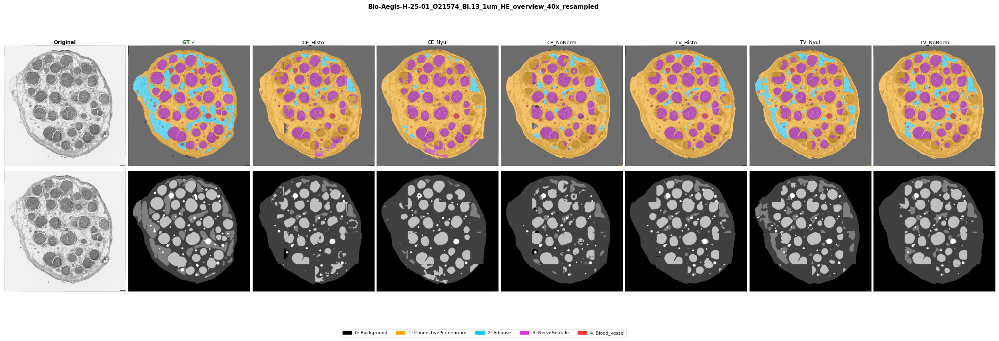

In [13]:
# ── Show one specific image  (edit stem to inspect a different one) ────────
if STEMS:
    compare_image(STEMS[0])


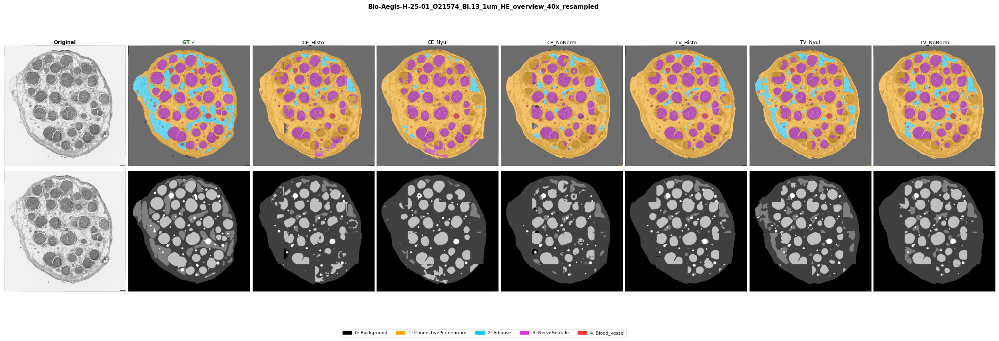

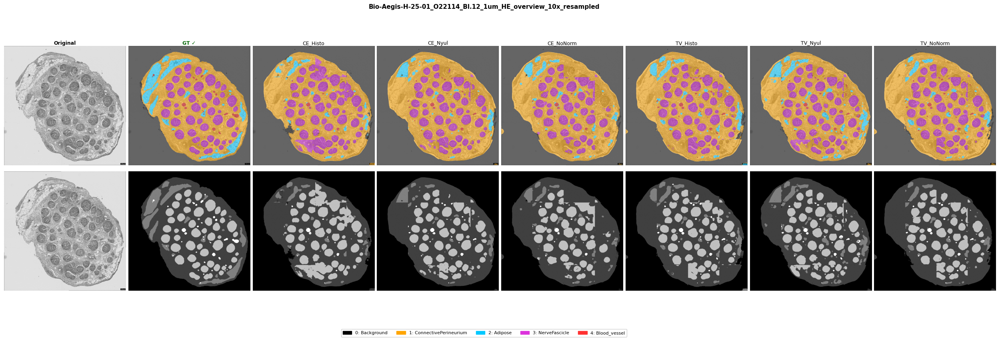

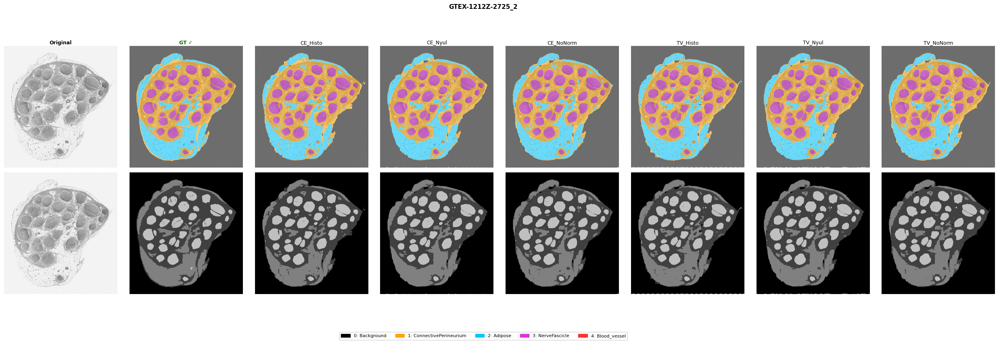

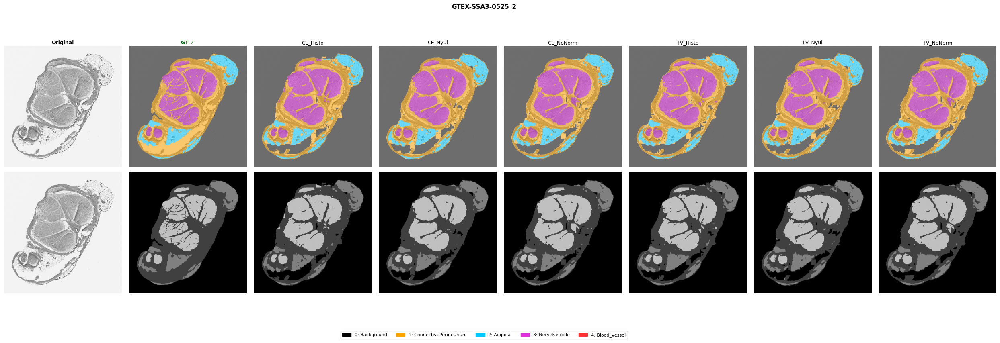

In [14]:
# ── Full gallery: one figure per test image ────────────────────────────────
for stem in STEMS:
    compare_image(stem)


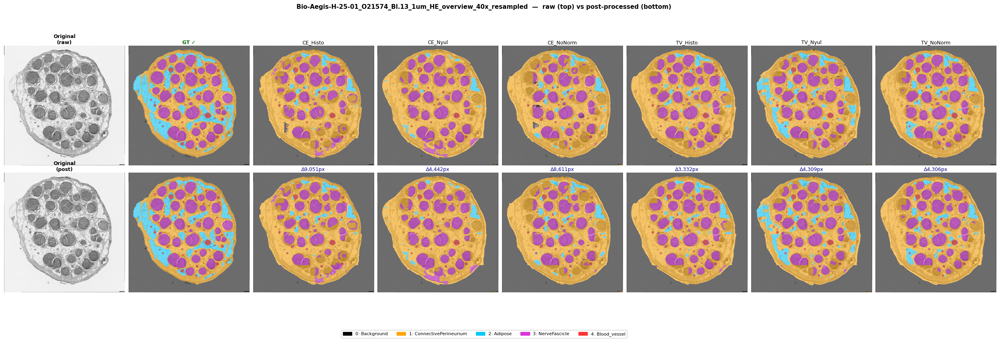

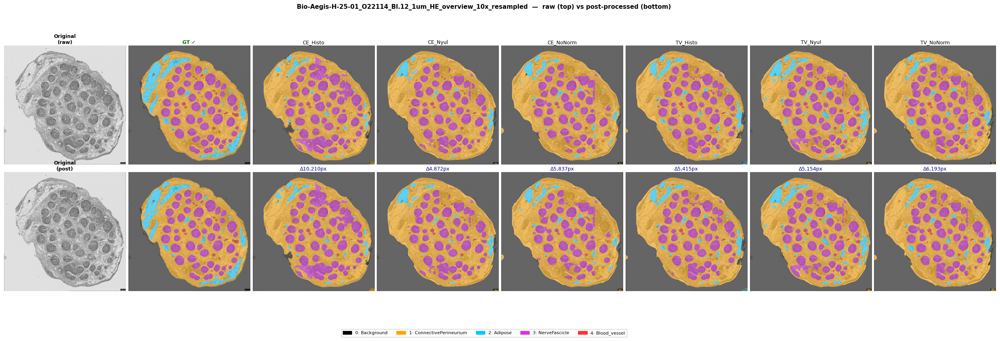

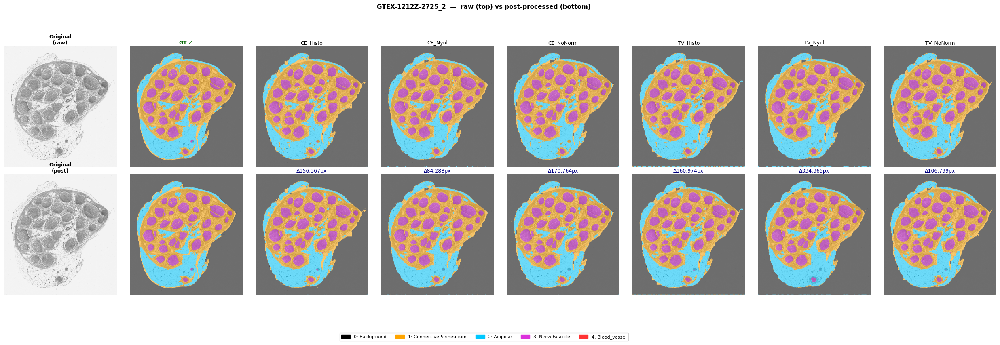

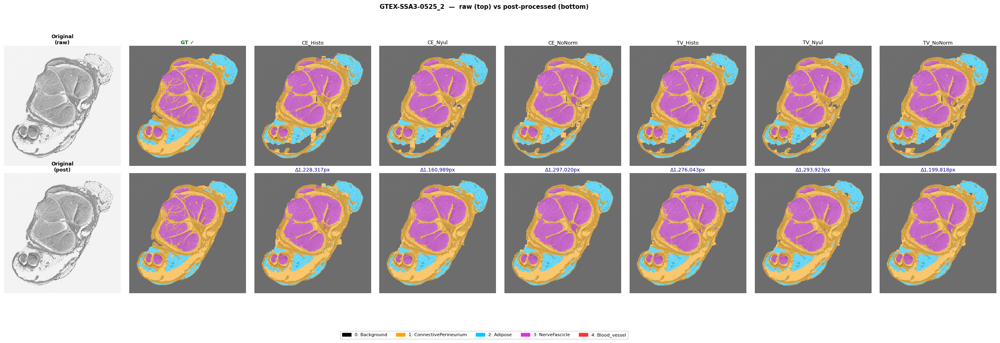

In [15]:
def compare_postpro(stem: str, alpha: float = 0.55, col_width: int = 4):
    """
    Columns: Original | GT ✓ | CE_Histo | CE_Nyul | CE_NoNorm | TV_Histo | TV_Nyul | TV_NoNorm
    Row 0: raw prediction overlay on original
    Row 1: post-processed overlay on original (title shows Δ changed pixels)
    """
    if not results:
        print('No results loaded.'); return

    orig_arr = None
    for lbl in results:
        p = os.path.join(results[lbl]['dir'], f'{stem}_orig.tif')
        if os.path.exists(p):
            orig_arr = np.array(Image.open(p).convert('L'))
            break
    if orig_arr is None:
        print(f'Original not found for {stem}'); return

    gt         = GTS.get(stem)
    exp_labels = list(results.keys())
    gt_cols    = 1 if gt is not None else 0
    n_cols     = 1 + gt_cols + len(exp_labels)

    fig, ax = plt.subplots(2, n_cols,
                           figsize=(col_width * n_cols, col_width * 2),
                           gridspec_kw={'hspace': 0.06, 'wspace': 0.02})

    def _overlay(row, col, label_map, title, bold=False, color='black'):
        ax[row, col].imshow(orig_arr, cmap='gray')
        ax[row, col].imshow(label_to_rgba(label_map, alpha))
        ax[row, col].axis('off')
        if title:
            ax[row, col].set_title(title, fontsize=9,
                                   fontweight='bold' if bold else 'normal',
                                   color=color, pad=3)

    # Col 0: original (both rows)
    for row in range(2):
        ax[row, 0].imshow(orig_arr, cmap='gray')
        ax[row, 0].axis('off')
    ax[0, 0].set_title('Original\n(raw)', fontsize=9, fontweight='bold', pad=3)
    ax[1, 0].set_title('Original\n(post)', fontsize=9, fontweight='bold', pad=3)

    col = 1
    if gt is not None:
        _overlay(0, col, gt, 'GT ✓', bold=True, color='darkgreen')
        _overlay(1, col, gt, '',     bold=True, color='darkgreen')
        col += 1

    for label in exp_labels:
        pred_path    = results[label]['preds'].get(stem)
        postpro_path = pred_path.replace('_pred.tif', '_pred_postpro.tif') if pred_path else None

        raw  = np.array(Image.open(pred_path))    if pred_path    and os.path.exists(pred_path)    else None
        post = np.array(Image.open(postpro_path)) if postpro_path and os.path.exists(postpro_path) else None

        # Row 0: raw
        if raw is not None:
            _overlay(0, col, raw, label)
        else:
            ax[0, col].axis('off')

        # Row 1: post-processed
        if post is not None:
            delta = f'Δ{int((raw != post).sum()):,}px' if raw is not None else 'post'
            _overlay(1, col, post, delta, color='navy')
        elif raw is not None:
            _overlay(1, col, raw, '(no post)')
        else:
            ax[1, col].axis('off')

        col += 1

    fig.suptitle(f'{stem}  —  raw (top) vs post-processed (bottom)',
                 fontsize=11, fontweight='bold', y=1.01)
    fig.legend(handles=LEGEND, loc='lower center', ncol=len(CLASS_INFO),
               fontsize=8, framealpha=0.9, bbox_to_anchor=(0.5, -0.04))
    plt.show()


# ── Post-processed gallery ────────────────────────────────────────────────────
for stem in STEMS:
    compare_postpro(stem)


In [16]:
import pandas as pd

def class_distribution(stem: str) -> pd.DataFrame:
    """Per-class pixel % for GT and every experiment on the given source image."""
    rows = []
    def _row(name, arr):
        total = arr.size
        r = {'Experiment': name}
        for cls, (cname, _) in CLASS_INFO.items():
            r[f'cls{cls}_{cname[:6]}%'] = round(100 * (arr == cls).sum() / total, 2)
        return r

    # Ground truth first
    gt = GTS.get(stem)
    if gt is not None:
        rows.append(_row('GT ✓', gt))

    for label in results:
        pred_path = results[label]['preds'].get(stem)
        if pred_path is None:
            continue
        rows.append(_row(label, np.array(Image.open(pred_path))))

    return pd.DataFrame(rows).set_index('Experiment')

# ── Summary table for all test images ─────────────────────────────────────
for stem in STEMS:
    print(f'\nClass distribution (%) — {stem}')
    display(class_distribution(stem).round(2))



Class distribution (%) — Bio-Aegis-H-25-01_O21574_Bl.13_1um_HE_overview_40x_resampled


,cls0_Backgr%,cls1_Connec%,cls2_Adipos%,cls3_NerveF%,cls4_Blood_%
Experiment,,,,,
GT ✓,43.67,27.01,12.27,15.61,1.44
CE_Histo,42.98,41.90,2.12,12.16,0.83
CE_Nyul,41.76,41.53,1.32,14.74,0.65
CE_NoNorm,42.38,42.73,2.85,11.33,0.71
TV_Histo,41.96,40.42,2.30,14.33,0.98
TV_Nyul,42.07,37.93,6.30,12.77,0.94
TV_NoNorm,41.59,40.27,3.79,13.53,0.83



Class distribution (%) — Bio-Aegis-H-25-01_O22114_Bl.12_1um_HE_overview_10x_resampled


,cls0_Backgr%,cls1_Connec%,cls2_Adipos%,cls3_NerveF%,cls4_Blood_%
Experiment,,,,,
GT ✓,42.84,35.84,6.95,13.66,0.71
CE_Histo,42.56,38.35,1.99,16.86,0.24
CE_Nyul,41.49,42.03,2.29,13.82,0.36
CE_NoNorm,41.23,43.12,2.55,12.87,0.23
TV_Histo,41.25,41.05,3.16,14.08,0.47
TV_Nyul,41.27,39.81,4.32,14.06,0.53
TV_NoNorm,41.14,42.31,2.29,13.87,0.39



Class distribution (%) — GTEX-1212Z-2725_2


,cls0_Backgr%,cls1_Connec%,cls2_Adipos%,cls3_NerveF%,cls4_Blood_%
Experiment,,,,,
GT ✓,47.18,26.72,14.45,11.65,0.0
CE_Histo,47.30,26.15,13.93,12.61,0.0
CE_Nyul,47.51,25.13,14.78,12.57,0.0
CE_NoNorm,47.40,25.17,14.69,12.73,0.0
TV_Histo,46.98,25.30,15.15,12.57,0.0
TV_Nyul,47.46,24.97,15.06,12.51,0.0
TV_NoNorm,47.22,25.57,14.49,12.72,0.0



Class distribution (%) — GTEX-SSA3-0525_2


,cls0_Backgr%,cls1_Connec%,cls2_Adipos%,cls3_NerveF%,cls4_Blood_%
Experiment,,,,,
GT ✓,56.15,24.59,6.21,13.05,0.0
CE_Histo,58.49,20.72,6.14,14.65,0.0
CE_Nyul,58.72,20.78,6.34,14.17,0.0
CE_NoNorm,58.86,19.76,6.48,14.91,0.0
TV_Histo,58.67,20.43,6.56,14.34,0.0
TV_Nyul,59.06,20.53,6.52,13.89,0.0
TV_NoNorm,58.66,20.17,6.54,14.63,0.0


## Per-Class Focal Tversky — New Experiments Comparison

Compares the new `TverskyPerClass` trainer (per-class α/β + corrected CE weights) against the two Nyul-normalisation baselines (`CE_Nyul`, `TV_Nyul`).

Run inference + reconstruction + postprocessing **first** (see `run_experiments.sh`), then execute the cell below to load the fresh results and visualise them.

[TV_PC_Nyul] 4 prediction files found

Class distribution (%) — Bio-Aegis-H-25-01_O21574_Bl.13_1um_HE_overview_40x_resampled


,cls0_Backgr%,cls1_Connec%,cls2_Adipos%,cls3_NerveF%,cls4_Blood_%
Experiment,,,,,
GT ✓,43.67,27.01,12.27,15.61,1.44
CE_Nyul,41.76,41.53,1.32,14.74,0.65
TV_Nyul,42.07,37.93,6.30,12.77,0.94
TV_PC_Nyul,47.61,40.64,4.18,7.24,0.34



Class distribution (%) — Bio-Aegis-H-25-01_O22114_Bl.12_1um_HE_overview_10x_resampled


,cls0_Backgr%,cls1_Connec%,cls2_Adipos%,cls3_NerveF%,cls4_Blood_%
Experiment,,,,,
GT ✓,42.84,35.84,6.95,13.66,0.71
CE_Nyul,41.49,42.03,2.29,13.82,0.36
TV_Nyul,41.27,39.81,4.32,14.06,0.53
TV_PC_Nyul,47.79,35.75,4.61,11.53,0.31



Class distribution (%) — GTEX-1212Z-2725_2


,cls0_Backgr%,cls1_Connec%,cls2_Adipos%,cls3_NerveF%,cls4_Blood_%
Experiment,,,,,
GT ✓,47.18,26.72,14.45,11.65,0.0
CE_Nyul,47.51,25.13,14.78,12.57,0.0
TV_Nyul,47.46,24.97,15.06,12.51,0.0
TV_PC_Nyul,48.14,23.30,16.15,12.41,0.0



Class distribution (%) — GTEX-SSA3-0525_2


,cls0_Backgr%,cls1_Connec%,cls2_Adipos%,cls3_NerveF%,cls4_Blood_%
Experiment,,,,,
GT ✓,56.15,24.59,6.21,13.05,0.0
CE_Nyul,58.72,20.78,6.34,14.17,0.0
TV_Nyul,59.06,20.53,6.52,13.89,0.0
TV_PC_Nyul,59.86,20.28,7.06,12.80,0.0



Dice per experiment / image:


Dice_cls0_Backgr  \
stem                                               Experiment                     
Bio-Aegis-H-25-01_O21574_Bl.13_1um_HE_overview_... CE_Nyul               0.9770   
                                                   TV_Nyul               0.9770   
                                                   TV_PC_Nyul            0.9404   
Bio-Aegis-H-25-01_O22114_Bl.12_1um_HE_overview_... CE_Nyul               0.9755   
                                                   TV_Nyul               0.9780   
                                                   TV_PC_Nyul            0.9305   
GTEX-1212Z-2725_2                                  CE_Nyul               0.9872   
                                                   TV_Nyul               0.9855   
                                                   TV_PC_Nyul            0.9829   
GTEX-SSA3-0525_2                                   CE_Nyul               0.9682   
                                                   TV_Nyul               0.9651   
                                                   TV_PC_Nyul            0.9602   

                                                               Dice_cls1_Connec  \
stem                                               Experiment                     
Bio-Aegis-H-25-01_O21574_Bl.13_1um_HE_overview_... CE_Nyul               0.7424   
                                                   TV_Nyul               0.7955   
                                                   TV_PC_Nyul            0.7152   
Bio-Aegis-H-25-01_O22114_Bl.12_1um_HE_overview_... CE_Nyul               0.8659   
                                                   TV_Nyul               0.8661   
                                                   TV_PC_Nyul            0.8387   
GTEX-1212Z-2725_2                                  CE_Nyul               0.9230   
                                                   TV_Nyul               0.9219   
                                                   TV_PC_Nyul            0.8965   
GTEX-SSA3-0525_2                                   CE_Nyul               0.8563   
                                                   TV_Nyul               0.8482   
                                                   TV_PC_Nyul            0.8096   

                                                               Dice_cls2_Adipos  \
stem                                               Experiment                     
Bio-Aegis-H-25-01_O21574_Bl.13_1um_HE_overview_... CE_Nyul               0.1891   
                                                   TV_Nyul               0.6113   
                                                   TV_PC_Nyul            0.3729   
Bio-Aegis-H-25-01_O22114_Bl.12_1um_HE_overview_... CE_Nyul               0.3808   
                                                   TV_Nyul               0.5277   
                                                   TV_PC_Nyul            0.4906   
GTEX-1212Z-2725_2                                  CE_Nyul               0.9341   
                                                   TV_Nyul               0.9283   
                                                   TV_PC_Nyul            0.9089   
GTEX-SSA3-0525_2                                   CE_Nyul               0.9258   
                                                   TV_Nyul               0.9154   
                                                   TV_PC_Nyul            0.8943   

                                                               Dice_cls3_NerveF  \
stem                                               Experiment                     
Bio-Aegis-H-25-01_O21574_Bl.13_1um_HE_overview_... CE_Nyul               0.8687   
                                                   TV_Nyul               0.8646   
                                                   TV_PC_Nyul            0.5953   
Bio-Aegis-H-25-01_O22114_Bl.12_1um_HE_overview_... CE_Nyul               0.9079   
                                                   TV_Nyul               0.8


Mean Dice (across all test images):


,Dice_cls0_Backgr,Dice_cls1_Connec,Dice_cls2_Adipos,Dice_cls3_NerveF,Dice_cls4_Blood_
Experiment,,,,,
CE_Nyul,0.9770,0.8469,0.6074,0.9140,0.5712
TV_Nyul,0.9764,0.8579,0.7457,0.9128,0.6255
TV_PC_Nyul,0.9535,0.8150,0.6667,0.8222,0.4202


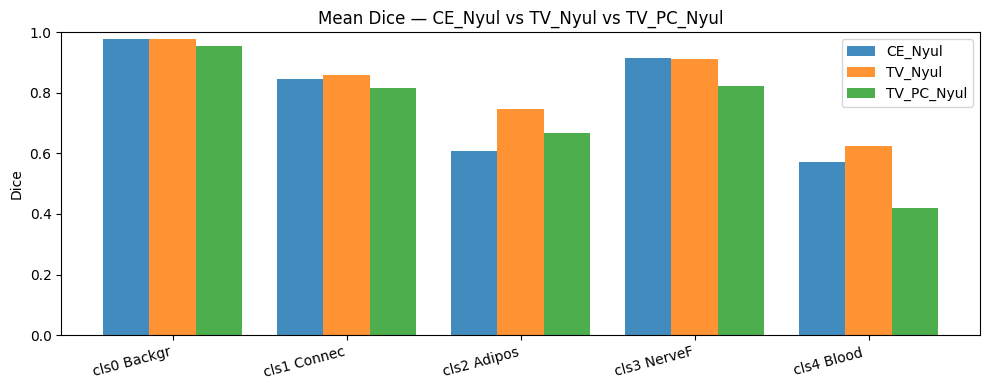

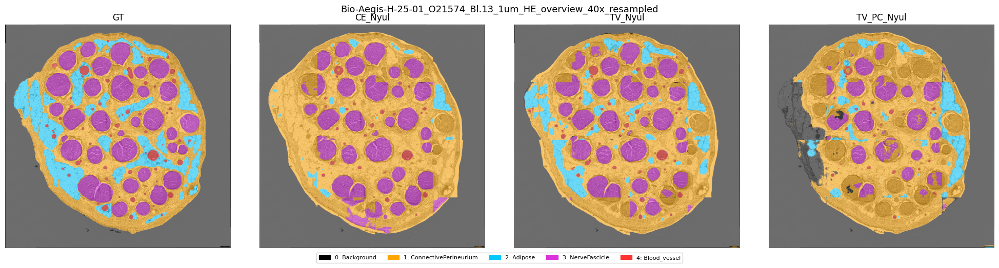

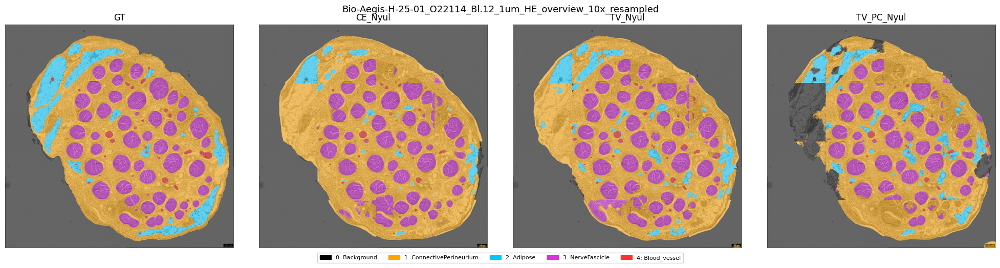

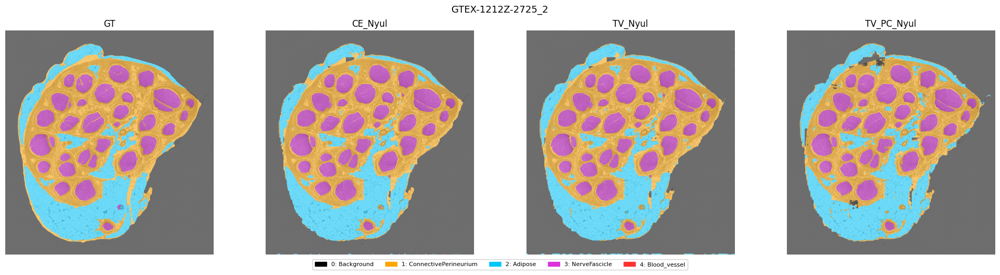

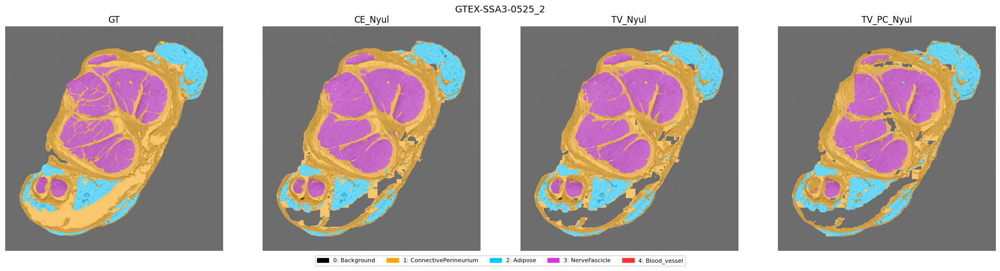

In [17]:
import os, numpy as np, pandas as pd
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# ── New experiments to evaluate ───────────────────────────────────────────
NEW_EXPERIMENTS = [
    ('TV_PC_Nyul', 'nnUNetTrainerAdamEarlyStopping_TverskyPerClass', 'nnUNetPlansNyulNorm'),
]

# Baselines already loaded in `results`
NYUL_BASELINES = ['CE_Nyul', 'TV_Nyul']

# ── Load predictions for new experiments ─────────────────────────────────
new_results = {}
for _label, _trainer, _plan in NEW_EXPERIMENTS:
    _recon_dir = os.path.join(
        RESULTS_ROOT,
        f'{_trainer}__{_plan}__2d', f'fold_{FOLD}', 'reconstructed',
    )
    if not os.path.isdir(_recon_dir):
        print(f'[{_label}] NOT FOUND — training still in progress?\n  Expected: {_recon_dir}')
        new_results[_label] = {'preds': {}, 'dir': None}
        continue
    _pred_files = sorted(Path(_recon_dir).glob('*_pred.tif'))
    _preds_map = {p.name.replace('_pred.tif', ''): str(p) for p in _pred_files}
    new_results[_label] = {'preds': _preds_map, 'dir': _recon_dir}
    print(f'[{_label}] {len(_preds_map)} prediction files found')

# Merged view
_all_labels = NYUL_BASELINES + [l for l, *_ in NEW_EXPERIMENTS]

def _get_preds(lbl):
    src = results if lbl in results else new_results
    return src.get(lbl, {}).get('preds', {})

def _get_dir(lbl):
    src = results if lbl in results else new_results
    return src.get(lbl, {}).get('dir', None)

# ── Per-image class distribution tables ───────────────────────────────────
def _class_dist(stem):
    rows = []
    gt = GTS.get(stem)
    if gt is not None:
        r = {'Experiment': 'GT ✓'}
        for cls, (cname, _) in CLASS_INFO.items():
            r[f'cls{cls}_{cname[:6]}%'] = round(100 * (gt == cls).sum() / gt.size, 2)
        rows.append(r)
    for lbl in _all_labels:
        p = _get_preds(lbl).get(stem)
        if p is None:
            continue
        arr = np.array(Image.open(p))
        r = {'Experiment': lbl}
        for cls, (cname, _) in CLASS_INFO.items():
            r[f'cls{cls}_{cname[:6]}%'] = round(100 * (arr == cls).sum() / arr.size, 2)
        rows.append(r)
    return pd.DataFrame(rows).set_index('Experiment') if rows else None

for stem in STEMS:
    df = _class_dist(stem)
    if df is not None:
        print(f'\nClass distribution (%) — {stem}')
        display(df)

# ── Dice vs GT ────────────────────────────────────────────────────────────
def _dice_row(stem, lbl):
    gt = GTS.get(stem)
    if gt is None: return None
    p = _get_preds(lbl).get(stem)
    if p is None: return None
    pred = np.array(Image.open(p))
    r = {'stem': stem, 'Experiment': lbl}
    for cls, (cname, _) in CLASS_INFO.items():
        gt_m, pred_m = (gt == cls), (pred == cls)
        inter = (gt_m & pred_m).sum()
        denom = gt_m.sum() + pred_m.sum()
        r[f'Dice_cls{cls}_{cname[:6]}'] = round(2 * inter / denom, 4) if denom > 0 else float('nan')
    return r

_dice_rows = [_dice_row(s, l) for s in STEMS for l in _all_labels]
_dice_rows = [r for r in _dice_rows if r is not None]

if _dice_rows:
    dice_df = pd.DataFrame(_dice_rows).set_index(['stem', 'Experiment'])
    _dice_cols = [c for c in dice_df.columns if c.startswith('Dice_')]
    print('\nDice per experiment / image:')
    display(dice_df[_dice_cols])

    mean_dice = dice_df[_dice_cols].groupby('Experiment').mean().round(4)
    print('\nMean Dice (across all test images):')
    display(mean_dice)

    # Bar chart
    fig, ax = plt.subplots(figsize=(10, 4))
    x = np.arange(len(_dice_cols))
    w = 0.8 / len(_all_labels)
    cmap = plt.get_cmap('tab10')
    for i, lbl in enumerate(_all_labels):
        if lbl not in mean_dice.index: continue
        vals = mean_dice.loc[lbl, _dice_cols].values.astype(float)
        ax.bar(x + i * w, vals, w, label=lbl, color=cmap(i), alpha=0.85)
    ax.set_xticks(x + w * (len(_all_labels) - 1) / 2)
    ax.set_xticklabels([c.replace('Dice_cls', 'cls').replace('_', ' ') for c in _dice_cols],
                       rotation=15, ha='right')
    ax.set_ylabel('Dice'); ax.set_ylim(0, 1)
    ax.set_title('Mean Dice — CE_Nyul vs TV_Nyul vs TV_PC_Nyul')
    ax.legend(); fig.tight_layout(); plt.show()
else:
    print('No Dice results yet — run inference + reconstruction for the new experiment first.')

# ── Side-by-side overlays — same colour scheme as other cells ─────────────
def _find_orig(stem):
    for lbl in _all_labels:
        d = _get_dir(lbl)
        if d is None:
            continue
        cand = Path(d, f'{stem}_orig.tif')
        if cand.exists():
            return str(cand)
    return None

for stem in STEMS:
    orig_path = _find_orig(stem)
    if orig_path is None:
        print(f'[SKIP] no _orig.tif for {stem}')
        continue
    orig_arr = np.array(Image.open(orig_path).convert('L'))
    gt = GTS.get(stem)
    _cols = ['GT'] + _all_labels
    fig, axes = plt.subplots(1, len(_cols), figsize=(5 * len(_cols), 5))
    fig.suptitle(stem, fontsize=13)
    for ax, col in zip(axes, _cols):
        if col == 'GT':
            seg = gt
        else:
            _p = _get_preds(col).get(stem)
            seg = np.array(Image.open(_p)) if _p else None
        if seg is None:
            ax.text(0.5, 0.5, 'N/A', ha='center', va='center', transform=ax.transAxes)
        else:
            ax.imshow(orig_arr, cmap='gray')
            ax.imshow(label_to_rgba(seg, alpha=0.55))
        ax.set_title(col); ax.axis('off')
    fig.legend(handles=LEGEND, loc='lower center', ncol=len(CLASS_INFO),
               fontsize=8, framealpha=0.9, bbox_to_anchor=(0.5, -0.04))
    fig.tight_layout(); plt.show()


## Phase 2 — Source-Equalized Oversampling & Augmentation

Comparing Phase 2 trainers against the Phase 1 best baseline (`TV_Nyul`).

| Label | Trainer | Key change |
|---|---|---|
| TV_Nyul | Tversky | Phase 1 best baseline |
| TV_Nyul_SourceEq | Tversky + SourceEqualized | Oversample underrepresented source images |
| TV_Nyul_SourceEq_HistoAug | Tversky + SourceEqualized + HistoAug | + extra histology augmentation |
| TV_PC_Soft_Nyul | TverskyPerClassSoft | Softened per-class Tversky |
| TV_PC_Soft_SourceEq | TverskyPerClassSoft + SourceEqualized | Softened per-class + oversampling |

In [ ]:
import os, numpy as np, pandas as pd
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt

P2_EXPERIMENTS = [
    ('TV_Nyul_SourceEq',          'nnUNetTrainerAdamEarlyStopping_Tversky_SourceEqualized',             'nnUNetPlansNyulNorm'),
    ('TV_Nyul_SourceEq_HistoAug', 'nnUNetTrainerAdamEarlyStopping_Tversky_SourceEqualized_HistoAug',    'nnUNetPlansNyulNorm'),
    ('TV_PC_Soft_Nyul',           'nnUNetTrainerAdamEarlyStopping_TverskyPerClassSoft',                 'nnUNetPlansNyulNorm'),
    ('TV_PC_Soft_SourceEq',       'nnUNetTrainerAdamEarlyStopping_TverskyPerClassSoft_SourceEqualized', 'nnUNetPlansNyulNorm'),
]

# Load Phase 2 predictions
p2_results = {}
for _label, _trainer, _plan in P2_EXPERIMENTS:
    _recon_dir = os.path.join(
        RESULTS_ROOT,
        f'{_trainer}__{_plan}__2d', f'fold_{FOLD}', 'reconstructed',
    )
    if not os.path.isdir(_recon_dir):
        print(f'[{_label}] NOT FOUND — training still in progress?\n  Expected: {_recon_dir}')
        p2_results[_label] = {'preds': {}, 'dir': None}
        continue
    _pred_files = sorted(Path(_recon_dir).glob('*_pred.tif'))
    _preds_map = {p.name.replace('_pred.tif', ''): str(p) for p in _pred_files}
    p2_results[_label] = {'preds': _preds_map, 'dir': _recon_dir}
    print(f'[{_label}] {len(_preds_map)} prediction files found')

P2_ALL_LABELS = ['TV_Nyul'] + [l for l, *_ in P2_EXPERIMENTS]

def p2_get_preds(lbl):
    if lbl in results: return results[lbl].get('preds', {})
    return p2_results.get(lbl, {}).get('preds', {})

def p2_get_dir(lbl):
    if lbl in results: return results[lbl].get('dir', None)
    return p2_results.get(lbl, {}).get('dir', None)


In [ ]:
# ── Dice per image ───────────────────────────────────────────────────────
def _p2_dice_row(stem, lbl):
    gt = GTS.get(stem)
    if gt is None: return None
    p = p2_get_preds(lbl).get(stem)
    if p is None: return None
    pred = np.array(Image.open(p))
    r = {'stem': stem, 'Experiment': lbl}
    for cls, (cname, _) in CLASS_INFO.items():
        if cls == 0: continue  # skip background
        gt_m, pred_m = (gt == cls), (pred == cls)
        inter = (gt_m & pred_m).sum()
        denom = gt_m.sum() + pred_m.sum()
        r[f'{cname[:8]}'] = round(2 * inter / denom, 4) if denom > 0 else float('nan')
    return r

_p2_rows = [_p2_dice_row(s, l) for s in STEMS for l in P2_ALL_LABELS]
_p2_rows = [r for r in _p2_rows if r is not None]
_p2_cls_cols = [c for c in (list(_p2_rows[0].keys()) if _p2_rows else []) if c not in ('stem', 'Experiment')]

if _p2_rows:
    p2_dice_df = pd.DataFrame(_p2_rows)
    display(p2_dice_df.set_index(['stem', 'Experiment'])[_p2_cls_cols])

    p2_mean = p2_dice_df.groupby('Experiment')[_p2_cls_cols].mean().reindex(P2_ALL_LABELS).round(4)
    # Δ vs TV_Nyul
    baseline = p2_mean.loc['TV_Nyul']
    delta_df = p2_mean.copy()
    for lbl in P2_ALL_LABELS[1:]:
        delta_df.loc[lbl] = (p2_mean.loc[lbl] - baseline).round(4)
    delta_df.loc['TV_Nyul'] = p2_mean.loc['TV_Nyul']
    print('\nMean Dice & Δ vs TV_Nyul (positive = improvement):')
    display(delta_df.style.background_gradient(cmap='RdYlGn', vmin=-0.05, vmax=0.05))
else:
    print('No Phase 2 results yet — run inference + reconstruction first.')


In [ ]:
# ── Bar chart — Phase 2 vs baseline ─────────────────────────────────────
if _p2_rows:
    _palette = {
        'TV_Nyul':                  '#888888',
        'TV_Nyul_SourceEq':         '#1f77b4',
        'TV_Nyul_SourceEq_HistoAug':'#2ca02c',
        'TV_PC_Soft_Nyul':          '#ff7f0e',
        'TV_PC_Soft_SourceEq':      '#9467bd',
    }
    fig, ax = plt.subplots(figsize=(11, 4))
    x = np.arange(len(_p2_cls_cols))
    w = 0.8 / len(P2_ALL_LABELS)
    for i, lbl in enumerate(P2_ALL_LABELS):
        if lbl not in p2_mean.index: continue
        vals = p2_mean.loc[lbl, _p2_cls_cols].values.astype(float)
        ax.bar(x + i * w, vals, w, label=lbl,
               color=_palette.get(lbl, f'C{i}'), alpha=0.85)
    ax.set_xticks(x + w * (len(P2_ALL_LABELS) - 1) / 2)
    ax.set_xticklabels(_p2_cls_cols, rotation=15, ha='right')
    ax.set_ylabel('Mean Dice'); ax.set_ylim(0, 1)
    ax.set_title('Phase 2 — Mean Dice per class')
    ax.legend(loc='lower right'); fig.tight_layout(); plt.show()


In [ ]:
# ── Side-by-side overlays — Phase 2 ─────────────────────────────────────
for stem in STEMS:
    orig_path = None
    for lbl in P2_ALL_LABELS:
        d = p2_get_dir(lbl)
        if d is None: continue
        cand = Path(d, f'{stem}_orig.tif')
        if cand.exists(): orig_path = str(cand); break
    if orig_path is None:
        print(f'[SKIP] no _orig.tif for {stem}'); continue
    orig_arr = np.array(Image.open(orig_path).convert('L'))
    gt = GTS.get(stem)
    _cols = ['GT'] + P2_ALL_LABELS
    fig, axes = plt.subplots(1, len(_cols), figsize=(5 * len(_cols), 5))
    fig.suptitle(f'Phase 2 overlays — {stem}', fontsize=13)
    for ax, col in zip(axes, _cols):
        seg = gt if col == 'GT' else (
            np.array(Image.open(p)) if (p := p2_get_preds(col).get(stem)) else None
        )
        if seg is None:
            ax.text(0.5, 0.5, 'N/A', ha='center', va='center', transform=ax.transAxes)
        else:
            ax.imshow(orig_arr, cmap='gray')
            ax.imshow(label_to_rgba(seg, alpha=0.55))
        ax.set_title(col, fontsize=8); ax.axis('off')
    fig.legend(handles=LEGEND, loc='lower center', ncol=len(CLASS_INFO),
               fontsize=8, framealpha=0.9, bbox_to_anchor=(0.5, -0.04))
    fig.tight_layout(); plt.show()
